In [1]:
import os
import numpy as np
import bpy

# Non-standard Python modules that may need to be installed. 
import h5py
from tqdm import tqdm
from IPython.display import Image

In [2]:
add_modifiers = False
apply_modifiers = False
smoothing_iterations = 5
decimate_ratio = 0.1
obj_scale = 10000
smooth_factor = 0.5

collection_name = "Collection"

save_progress = False # Save the file after each neuron is loaded.
render_frame = True # Render each new neuron as added to the file.
display_render = True # Display render in the notebook.

# First download and extract the h5 file
# From: https://www.microns-explorer.org/phase1
#https://zenodo.org/record/3710459/files/layer23_v185.tar.gz?download=1

# Local path to extracted h5 files (396 in total)
path = 'Z://Open_data_sets/MICrONS/layer23_v185/layer23_v185/'

save_path = 'Z://Blender/test_headless_MiCRONS.blend'
render_out = 'H://Renders/Blender/neurons_microns/headless/temp'
blend_template = 'Y://Blender/neurons(microns)/headless_template.blend'

In [3]:
N_NEURONS = 10

In [4]:
files = os.listdir(path)
files

# Load the template
bpy.ops.wm.open_mainfile(filepath=blend_template)

scene = bpy.context.scene
render = scene.render
render.filepath = render_out



Subset of files to build:  ['648518346349477331.h5', '648518346349487432.h5', '648518346349487752.h5', '648518346349488919.h5', '648518346349489861.h5', '648518346349489985.h5', '648518346349491311.h5', '648518346349491816.h5', '648518346349492130.h5', '648518346349492197.h5']


0it [00:00, ?it/s]

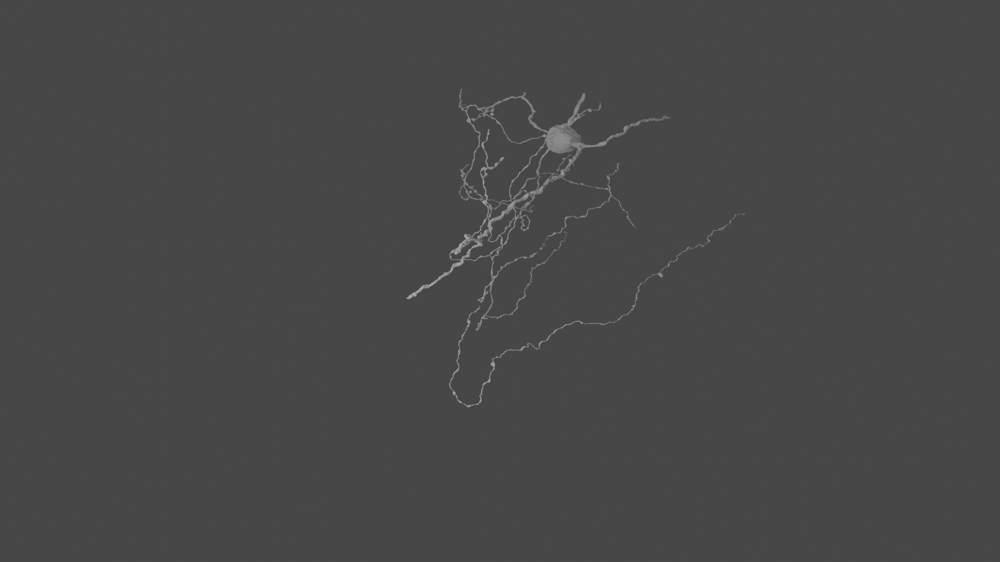

1it [00:10, 10.08s/it]

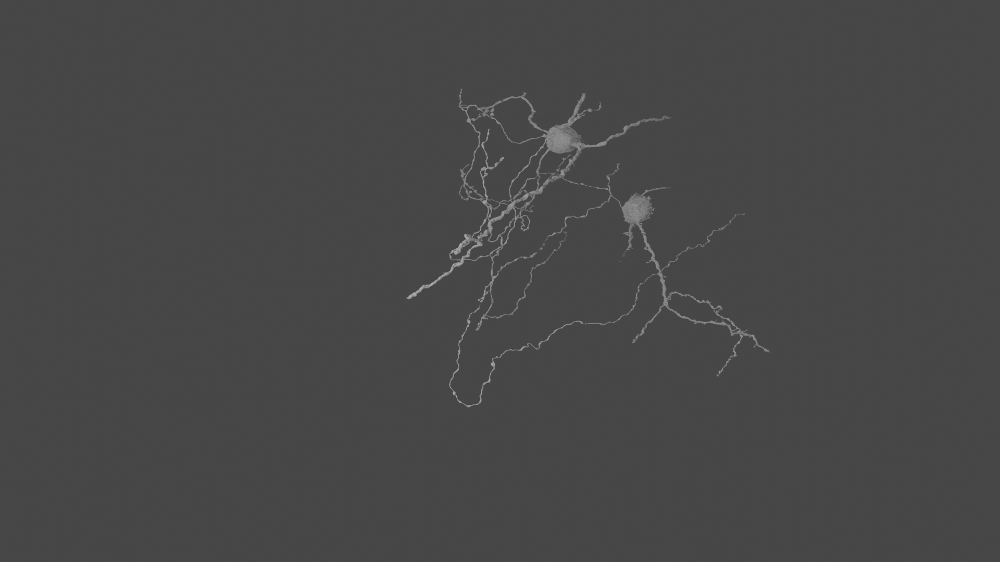

2it [00:13,  6.33s/it]

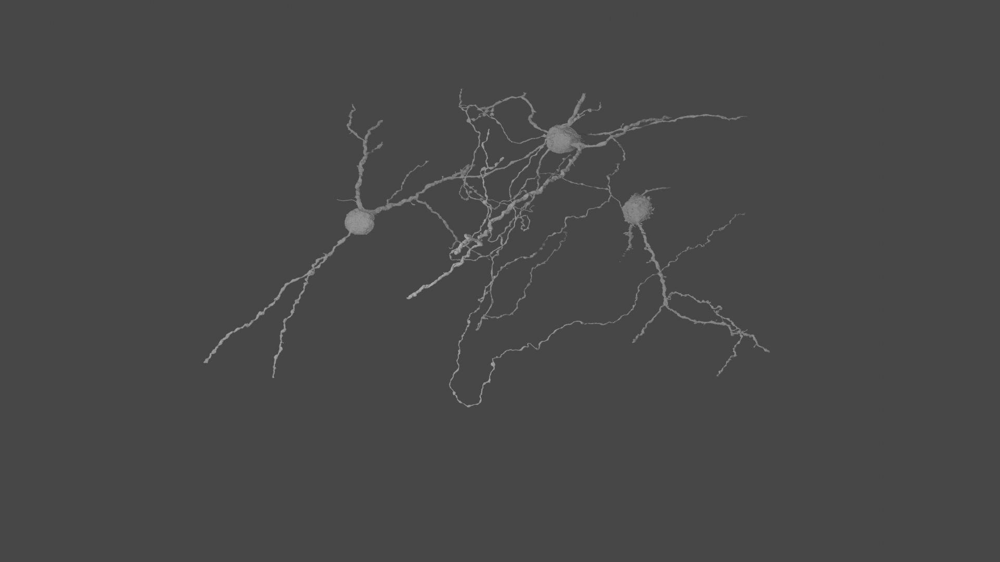

3it [00:19,  6.14s/it]

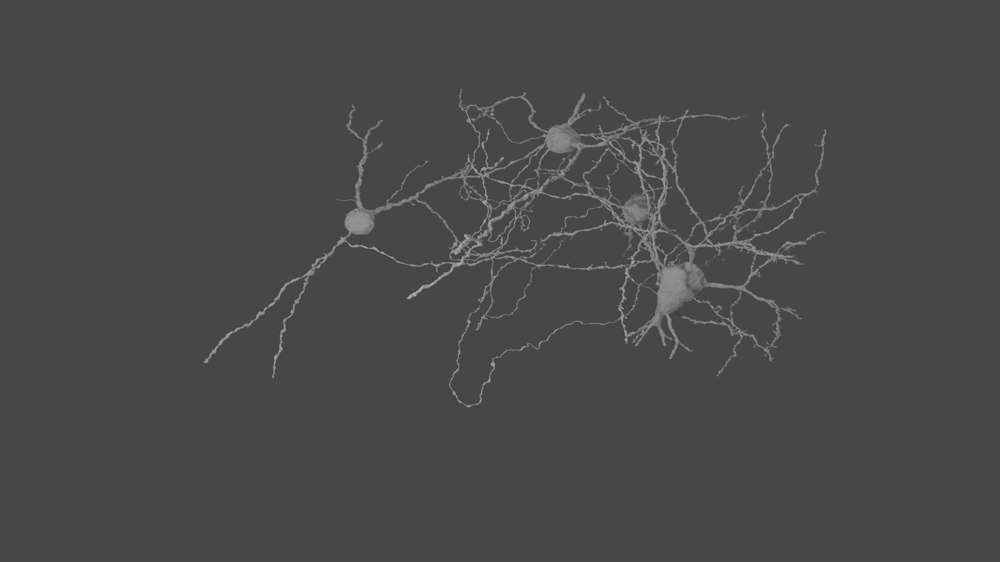

4it [00:32,  8.88s/it]

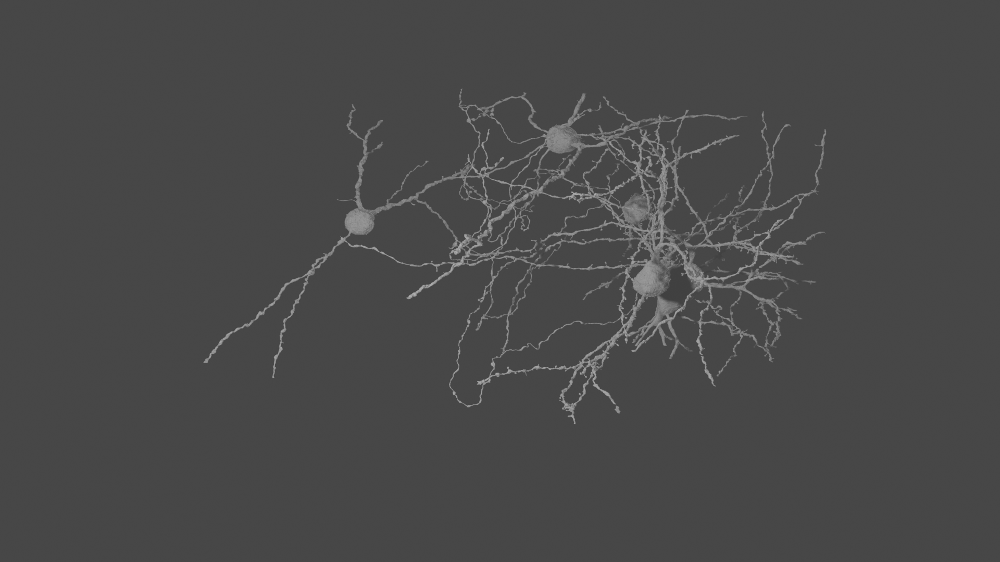

5it [00:42,  9.25s/it]

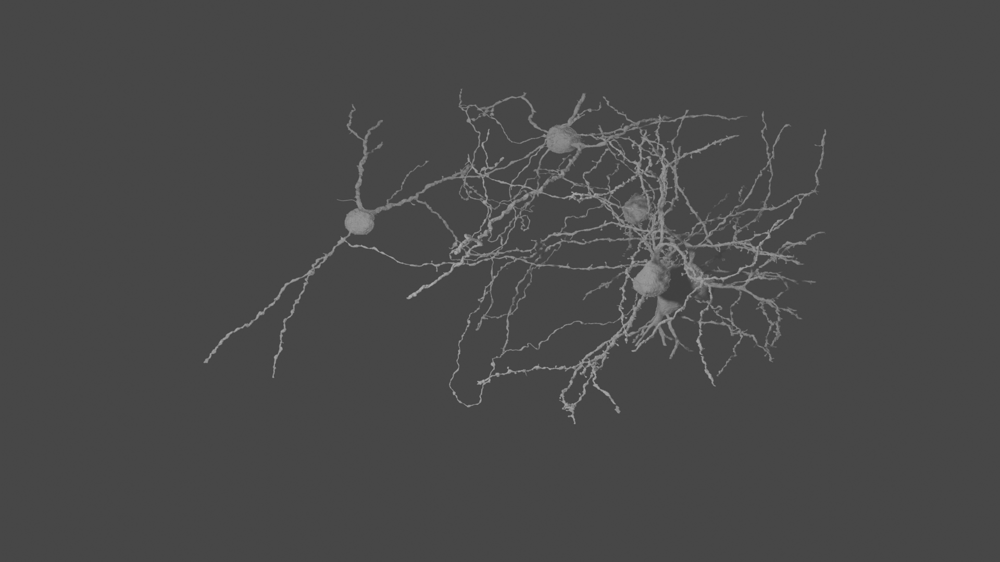

6it [00:45,  7.03s/it]

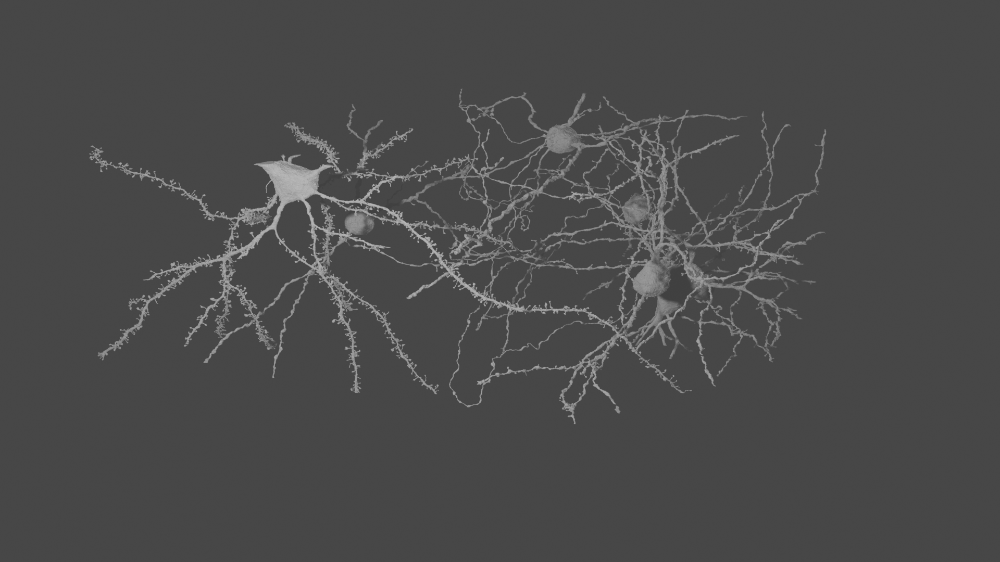

7it [01:01, 10.06s/it]

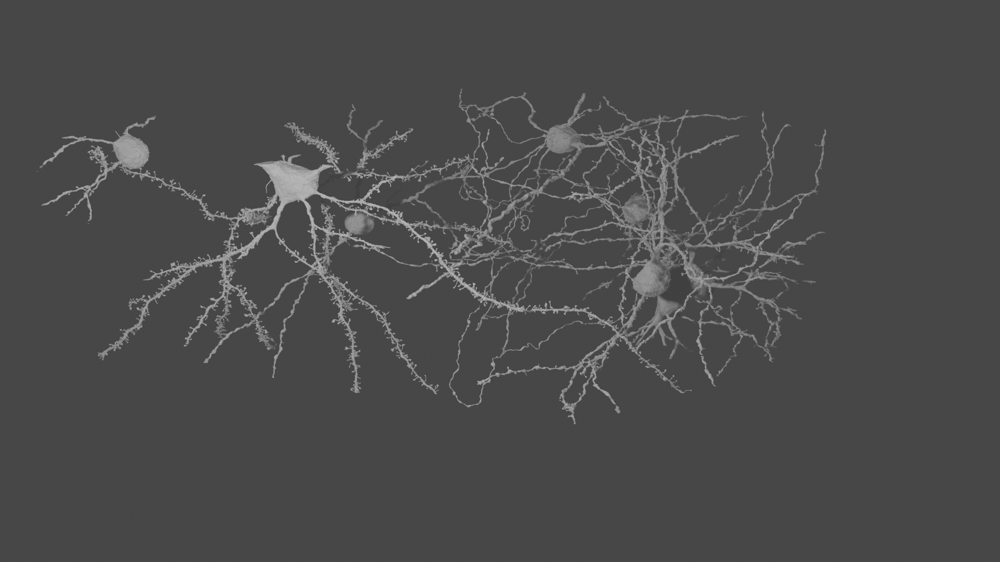

8it [01:05,  7.93s/it]

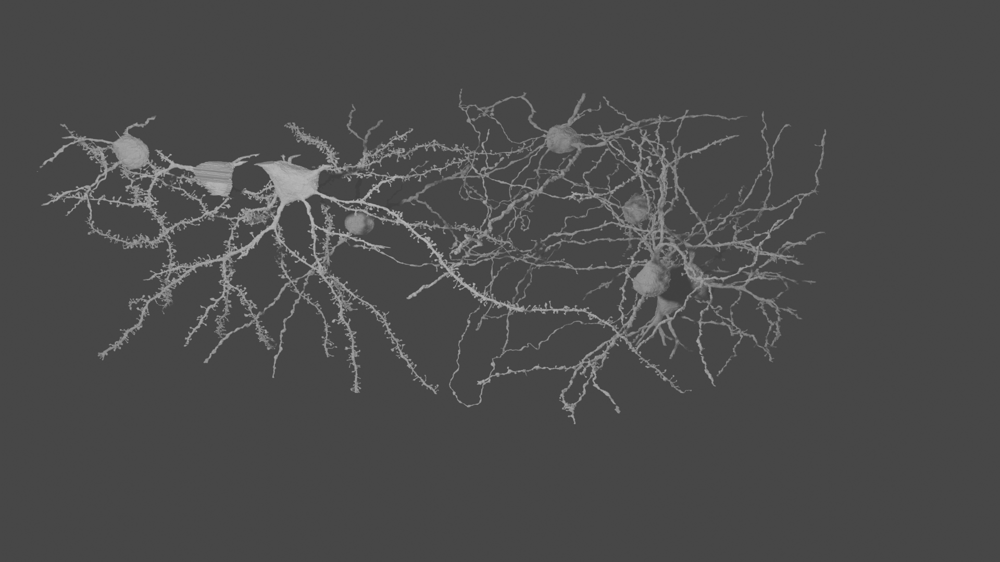

9it [01:15,  8.64s/it]

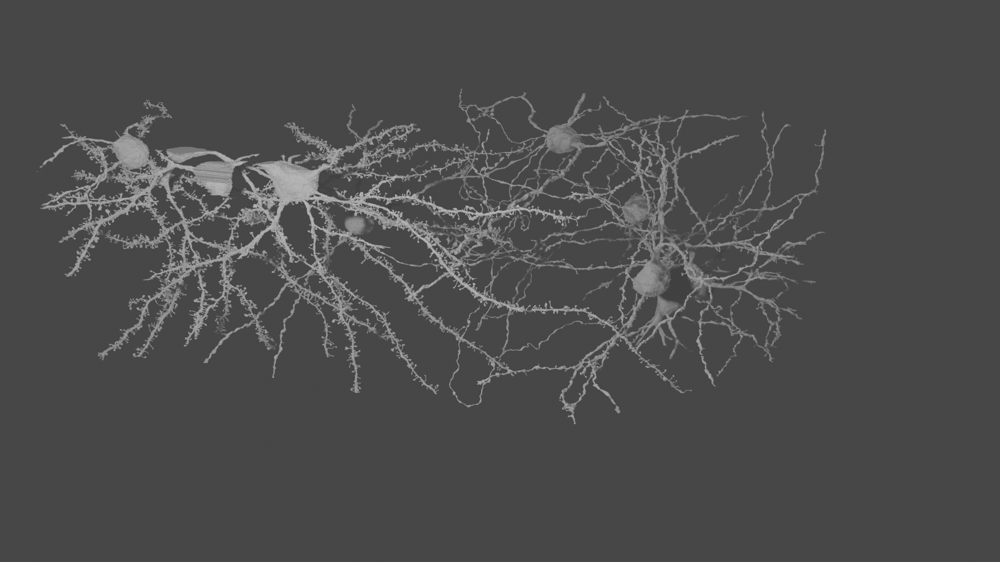

10it [01:31,  9.12s/it]


Info: Saved "test_headless_MiCRONS.blend"


{'FINISHED'}

In [5]:
def h5_to_mesh(file):

    obj_name = file[0:-3] # Name the object the same as the file, minus ext

    # Load verts, edges, faces from the h5 file. 
    f = h5py.File(os.path.join(path, file))
    verts = np.asarray(f['vertices']) / obj_scale
    edges = f['link_edges']
    faces = f['faces']

    # Create a new mesh. 
    mesh = bpy.data.meshes.new(obj_name)  # add the new mesh
    obj = bpy.data.objects.new(mesh.name, mesh)
    col = bpy.data.collections[collection_name]
    col.objects.link(obj)
    bpy.context.view_layer.objects.active = obj
    
    mesh.from_pydata(verts, edges, faces) # Build the mesh from Python data.

    # Add modifiers
    if add_modifiers:
        
        smoothing_modifier = obj.modifiers.new(name='smooth', type='SMOOTH')
        smoothing_modifier.factor = smooth_factor
        smoothing_modifier.iterations = smoothing_iterations

        decimate_modifier = obj.modifiers.new(name='decimate', type='DECIMATE')
        decimate_modifier.ratio = decimate_ratio

        if apply_modifiers:
            
            bpy.context.view_layer.objects.active = obj # 2.8
            while obj.modifiers:

                bpy.ops.object.modifier_apply(modifier=obj.modifiers[0].name)

# Alternatively, select the first N files to build
files = files[0:N_NEURONS] # Comment this line out to build all of them. 
print('Subset of files to build: ', files)

for i,file in tqdm(enumerate(files)):

    h5_to_mesh(file)

    if save_progress:
        bpy.ops.wm.save_mainfile(filepath=save_path)
        
    if render_frame:   

        render.filepath = render_out
        bpy.ops.render.render(write_still = True)

        if(display_render):
            
            # Display the image
            display(Image(filename=render_out+'.png'))

        
bpy.ops.wm.save_mainfile(filepath=save_path)